# Prompt Engineering: Introduction

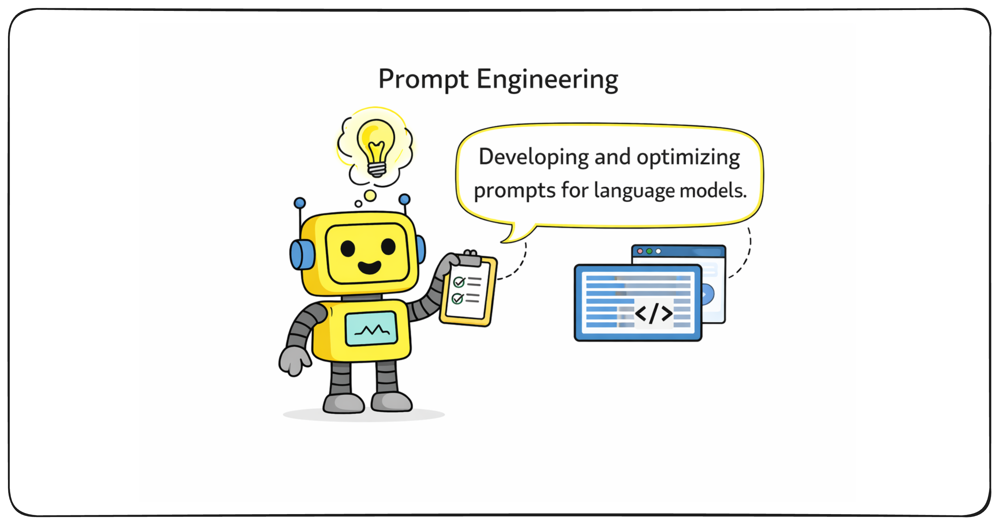

#Library Installations and Imports

In [1]:
!pip install -q opik

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.6/156.6 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.8/70.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 69.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 635.4/635.4 kB 32.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.7/99.7 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.0/345.0 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.1/278.1 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 3.9 MB/s eta 0:00:00


In [2]:
# Configure API Keys using getpass (recommended for local/dev notebooks)
import os
from getpass import getpass
# Opik for evaluation
import opik
from opik import track, Opik

# Setting the Environment

In [3]:
from getpass import getpass
# # Opik Configuration
# os.environ["OPIK_API_KEY"] = "<OPIK_API_KEY>" #getpass("Enter OPIK_API_KEY: ")
# os.environ["OPIK_WORKSPACE"] = "aniruddha-mukherjee" # getpass("Enter OPIK_WORKSPACE: ") #satya-pattnaik-0489

opik.configure(
    api_key=getpass("Enter OPIK_API_KEY: "),
    workspace="aniruddha-mukherjee"
)

# LLM Provider Keys
os.environ["OPENAI_API_KEY"] = getpass("Enter OPENAI_API_KEY: ") #getpass("Enter OPENAI_API_KEY: ")

# Initialize Opik client
opik_client = Opik()
print("✅ Opik initialized successfully!")



Do you want to use "test-aiml" project name? (Y/n)Y


OPIK: Configuration saved to file: /root/.opik.config
OPIK: Configuration completed successfully. Traces will be logged to 'test-aiml' project. To change the destination project, see: https://www.comet.com/docs/opik/tracing/log_traces#configuring-the-project-name


Set up the Opik MCP server for an AI assistant (Claude Code, Cursor, VS Code)? (y/N) y


OPIK: No supported AI host (Claude Code, Cursor, VS Code) was detected.
To set it up manually, add this to your host's MCP config (VS Code uses "servers" instead of "mcpServers"):
{
  "mcpServers": {
    "opik-mcp": {
      "type": "stdio",
      "command": "/usr/local/bin/uvx",
      "args": [
        "opik-mcp"
      ],
      "env": {
        "OPIK_API_KEY": "***REDACTED***",
        "COMET_WORKSPACE": "aniruddha-mukherjee"
      }
    }
  }
}
See https://www.comet.com/docs/opik/mcp-server for per-host instructions.


✅ Opik initialized successfully!


# Defining Utils for Inference

In [4]:
"""
Reusable Utilities for Prompt Engineering Examples
===================================================

This module provides clean, reusable functions for text generation
with both OpenAI and Hugging Face models.

Functions:
- load_openai_client(): Initialize OpenAI client
- load_hf_model(): Load Hugging Face model and tokenizer
- generate_openai(): Generate text using OpenAI API
- generate_hf(): Generate text using Hugging Face model
- format_prompt(): Simple template formatting
"""

import os
from typing import Optional, Dict, Any

# OpenAI imports
try:
    from openai import OpenAI
    OPENAI_AVAILABLE = True
except ImportError:
    OPENAI_AVAILABLE = False
    print("Warning: OpenAI not installed. Install with: pip install openai")

# Hugging Face imports
try:
    import torch
    from transformers import AutoModelForCausalLM, AutoTokenizer
    HF_AVAILABLE = True
except ImportError:
    HF_AVAILABLE = False
    print("Warning: Transformers not installed. Install with: pip install transformers torch")


# Global state for lazy loading
_openai_client = None
_hf_model = None
_hf_tokenizer = None


# ============================================================================
# OpenAI Utilities
# ============================================================================

def load_openai_client(api_key: Optional[str] = None) -> OpenAI:
    """
    Initialize and return an OpenAI client.

    Args:
        api_key: Optional API key. If not provided, reads from OPENAI_API_KEY env var.

    Returns:
        OpenAI client instance

    Usage:
        client = load_openai_client()
        # or
        client = load_openai_client(api_key="sk-...")
    """
    if not OPENAI_AVAILABLE:
        raise ImportError("OpenAI package not installed. Run: pip install openai")

    global _openai_client

    if _openai_client is None:
        key = api_key or os.getenv("OPENAI_API_KEY")
        if not key:
            raise ValueError(
                "No API key provided. Either pass api_key parameter or "
                "set OPENAI_API_KEY environment variable."
            )
        _openai_client = OpenAI(api_key=key)

    return _openai_client


def generate_openai(
    prompt: str,
    system_prompt: Optional[str] = None,
    model: str = "gpt-4o-mini",
    temperature: float = 0.7,
    max_tokens: int = 1024,
    **kwargs
) -> str:
    """
    Generate text using OpenAI API.

    Args:
        prompt: User message / main prompt
        system_prompt: Optional system message for context/instructions
        model: Model name (default: gpt-4o-mini)
        temperature: Sampling temperature (0.0 to 2.0)
        max_tokens: Maximum tokens to generate
        **kwargs: Additional OpenAI API parameters

    Returns:
        Generated text as string

    Example:
        response = generate_openai(
            prompt="Explain quantum entanglement",
            system_prompt="You are a physics teacher",
            temperature=0.3
        )
    """
    client = load_openai_client()

    # Build messages
    messages = []
    if system_prompt:
        messages.append({"role": "system", "content": system_prompt})
    messages.append({"role": "user", "content": prompt})

    # Call API
    response = client.chat.completions.create(
        model=model,
        messages=messages,
        temperature=temperature,
        max_tokens=max_tokens,
        **kwargs
    )

    return response.choices[0].message.content


# ============================================================================
# Hugging Face Utilities
# ============================================================================

def load_hf_model(
    model_name: str = "microsoft/Phi-3.5-mini-instruct",
    device: str = "auto",
    torch_dtype: Any = None
) -> tuple:
    """
    Load a Hugging Face model and tokenizer.

    Defaults to Phi-2, a small but capable model suitable for Colab.
    Uses lazy loading - model is loaded once and cached.

    Args:
        model_name: HF model identifier (default: microsoft/Phi-3.5-mini-instruct)
        device: Device placement ("auto", "cuda", "cpu")
        torch_dtype: Torch dtype (default: torch.float16 if available)

    Returns:
        (model, tokenizer) tuple

    Example:
        model, tokenizer = load_hf_model()
        # Model loads once, subsequent calls return cached version
    """
    if not HF_AVAILABLE:
        raise ImportError(
            "Transformers/PyTorch not installed. Run: "
            "pip install transformers torch"
        )

    global _hf_model, _hf_tokenizer

    if _hf_model is None or _hf_tokenizer is None:
        print(f"Loading {model_name}...")

        # Set default dtype
        if torch_dtype is None:
            torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

        # Load tokenizer
        _hf_tokenizer = AutoTokenizer.from_pretrained(
            model_name,
            trust_remote_code=True
        )

        # Load model
        _hf_model = AutoModelForCausalLM.from_pretrained(
            model_name,
            torch_dtype=torch_dtype,
            device_map=device
        )

        # Set pad token if not set
        if _hf_tokenizer.pad_token is None:
            _hf_tokenizer.pad_token = _hf_tokenizer.eos_token

        print(f"✓ Model loaded on {_hf_model.device}")

    return _hf_model, _hf_tokenizer


def generate_hf(
    prompt: str,
    max_new_tokens: int = 256,
    temperature: float = 0.7,
    do_sample: bool = True,
    top_p: float = 0.95,
    top_k: int = 50,
    **kwargs
) -> str:
    """
    Generate text using the loaded Hugging Face model.

    Args:
        prompt: Input text prompt
        max_new_tokens: Maximum new tokens to generate
        temperature: Sampling temperature (higher = more random)
        do_sample: Whether to use sampling (False = greedy decoding)
        top_p: Nucleus sampling parameter
        top_k: Top-k sampling parameter
        **kwargs: Additional generation parameters

    Returns:
        Generated text (excluding input prompt)

    Example:
        response = generate_hf(
            prompt="Write a haiku about coding:",
            max_new_tokens=100,
            temperature=0.8
        )
    """
    model, tokenizer = load_hf_model()

    # Tokenize input
    inputs = tokenizer(prompt, return_tensors="pt").to(model.device)
    input_length = inputs["input_ids"].shape[1]

    # Generate
    with torch.no_grad():
        outputs = model.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
            temperature=temperature if do_sample else None,
            do_sample=do_sample,
            top_p=top_p if do_sample else None,
            top_k=top_k if do_sample else None,
            pad_token_id=tokenizer.pad_token_id,
            **kwargs
        )

    # Decode only the new tokens (exclude input prompt)
    generated = tokenizer.decode(
        outputs[0][input_length:],
        skip_special_tokens=True
    )

    return generated.strip()


# ============================================================================
# Helper Utilities
# ============================================================================

def format_prompt(template: str, **variables) -> str:
    """
    Simple template formatting using {variable} syntax.

    Args:
        template: String with {placeholder} markers
        **variables: Key-value pairs for substitution

    Returns:
        Formatted string

    Example:
        template = "Hello {name}, you are {age} years old."
        result = format_prompt(template, name="Alice", age=30)
        # Output: "Hello Alice, you are 30 years old."
    """
    return template.format(**variables)


def print_response(title: str, response: str, width: int = 70):
    """
    Pretty-print a response with a title header.

    Args:
        title: Header title
        response: Text to print
        width: Width of separator line

    Example:
        print_response("GPT-4 Output", "The sky is blue because...")
    """
    print("\n" + "=" * width)
    print(f"  {title}")
    print("=" * width)
    print(response)
    print("=" * width + "\n")


def compare_responses(responses: Dict[str, str], width: int = 70):
    """
    Compare multiple model responses side by side.

    Args:
        responses: Dictionary of {model_name: response_text}
        width: Width of separator line

    Example:
        compare_responses({
            "GPT-4": "Response from GPT-4...",
            "Phi-2": "Response from Phi-2..."
        })
    """
    print("\n" + "=" * width)
    print("  MODEL COMPARISON")
    print("=" * width)

    for model_name, response in responses.items():
        print(f"\n[{model_name}]")
        print("-" * width)
        print(response)

    print("\n" + "=" * width + "\n")


# ============================================================================
# Validation & Info
# ============================================================================

def check_setup():
    """
    Verify that dependencies are installed and configured.
    Prints status of OpenAI and Hugging Face availability.
    """
    print("Checking setup...")
    print(f"  OpenAI: {'✓ Available' if OPENAI_AVAILABLE else '✗ Not installed'}")
    print(f"  Hugging Face: {'✓ Available' if HF_AVAILABLE else '✗ Not installed'}")

    if OPENAI_AVAILABLE:
        api_key = os.getenv("OPENAI_API_KEY")
        print(f"  OpenAI API Key: {'✓ Found' if api_key else '✗ Not set'}")

    if HF_AVAILABLE and torch.cuda.is_available():
        print(f"  CUDA: ✓ Available (GPU: {torch.cuda.get_device_name(0)})")
    elif HF_AVAILABLE:
        print(f"  CUDA: ⚠ Not available (will use CPU)")

    print()



#Testing Inference Util Functions

In [5]:
check_setup()

Checking setup...
  OpenAI: ✓ Available
  Hugging Face: ✓ Available
  OpenAI API Key: ✓ Found
  CUDA: ✓ Available (GPU: Tesla T4)



In [6]:
# OpenAI
response_gpt = generate_openai(
    prompt="Explain photosynthesis in one sentence",
    temperature=0.5
)
print(response_gpt)

Photosynthesis is the process by which green plants, algae, and some bacteria convert light energy, usually from the sun, into chemical energy in the form of glucose, using carbon dioxide and water while releasing oxygen as a byproduct.


In [ ]:
# Hugging Face (Phi-2)
response_phi = generate_hf(
    prompt="Explain photosynthesis in one sentence:",
    max_new_tokens=100,
    temperature=0.5
)
print(response_phi)

# Introduction to Prompt Engineering


# Introduction to Prompting

## The Bridge Between Human Intent and AI Understanding

Think about the last time you asked someone for help. You probably gave them context about your situation, explained what you needed, and maybe even shared how you'd like them to approach the problem.

Working with Large Language Models (LLMs) follows a similar pattern. A **prompt** is essentially your conversation starter with an AI system—it's how you communicate your needs, set expectations, and guide the model toward useful responses.

But here's what makes prompting fascinating: unlike traditional software where you write precise commands, prompting is more like **teaching through examples and instructions**. You're not programming in the traditional sense—you're communicating intent, and the model interprets that intent based on patterns it learned from vast amounts of text.

---

## What Is a Prompt?

At its core, a **prompt** is any text input you provide to an LLM. It can be:
- A question: *"What causes ocean tides?"*
- An instruction: *"Summarize this article in three sentences"*
- A partial text: *"Once upon a time, in a distant galaxy..."*
- A complex task: *"Analyze this customer feedback and identify the top 3 pain points"*

But to truly understand how prompts work, we need to peek under the hood.

---

## The Mathematical Foundation: P(Y | X, Θ)

At a high level, an LLM can be described with the following formulation:

$$P(Y \mid X, \theta)$$

Where:
- **X** — User Prompt (your input)
- **Y** — LLM Response (what the model generates)
- **Θ (Theta)** — Model Weights (what the model learned during training)

The model computes **the probability of generating a response Y** given your prompt **X** and its learned parameters **Θ**.

If you come from traditional machine learning, you can think of this as:
- **X (the prompt)** → your features
- **Y (the response)** → your prediction
- **Θ (theta)** → your model weights

But here's the key difference: **In traditional ML, features are fixed. In LLMs, you control the features through your prompt design.**

This is why prompt engineering matters—you're essentially doing feature engineering in natural language.

---

## Next Token Prediction: How LLMs Generate Text

Fundamentally, every generative LLM operates on a simple principle: **predicting what comes next**.

When you type:
```
"The customer service representative"
```

The model doesn't randomly guess the next word. It assigns probabilities based on patterns learned during training:
- "responded" → 40% probability
- "helped" → 30% probability
- "resolved" → 20% probability
- "walked" → 5% probability
- "disappeared" → 2% probability

The model learned these associations by reading millions of documents where "customer service representative" was followed by these words in various contexts.


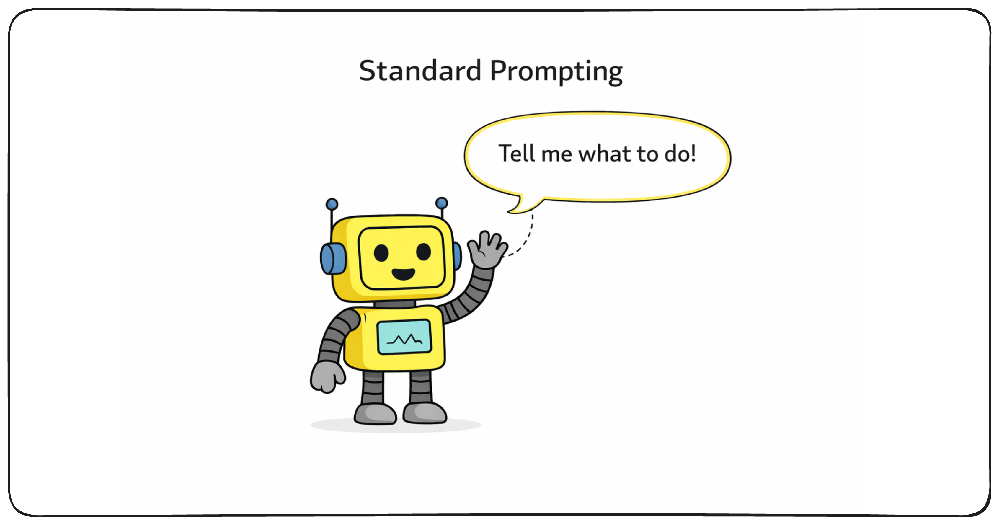

# Simple Prompting: The Foundation

## What is Simple Prompting?

**Simple prompting** (also called **standard prompting** or **direct prompting**) is the most basic way to interact with language models: you ask a question or give an instruction, and the model provides an answer directly, without showing intermediate reasoning steps.

This is how most people naturally interact with LLMs:
- "What is the capital of France?" → "Paris"
- "Translate this to Spanish" → [translation]
- "Summarize this article" → [summary]

The model processes your input and jumps straight to the output.

---

## Anatomy of a Simple Prompt

A simple prompt typically has three components:

### 1. **Task Definition** (What to do)
```
"Solve this math problem:"
"Classify the sentiment:"
"Generate a product description:"
```

### 2. **Context** (What to work with)
```
"Problem: 5 + 3 × 2 = ?"
"Review: This movie was fantastic!"
"Product: Wireless noise-canceling headphones"
```

### 3. **Output Specification** (Optional - how to format)
```
"Answer with just the number."
"Respond with: Positive, Negative, or Neutral"
"Keep it under 50 words."

## When Simple Prompting Works Well

Simple prompting is ideal for:

✅ **Factual recall** - "What is photosynthesis?"  
✅ **Simple calculations** - "What is 15% of 80?"  
✅ **Direct classification** - "Is this email spam?"  
✅ **Pattern completion** - "Complete this sentence: The quick brown fox..."  
✅ **Format conversion** - "Convert 100°F to Celsius"  
✅ **Simple generation** - "Write a one-sentence bio"  

These tasks don't require explicit reasoning steps - the model can answer directly.

---

## When Simple Prompting Fails

Simple prompting struggles with:

❌ **Multi-step reasoning** - "If Alice has twice as many apples as Bob, and Bob has 3 more than Carol who has 4..."  
❌ **Complex calculations** - "Calculate the compound interest on $5000 at 4.5% over 7 years"  
❌ **Logical deduction** - "All mammals are warm-blooded. Whales are mammals. Therefore..."  
❌ **Ambiguous problems** - "Is this marketing campaign effective?" (needs analysis framework)  
❌ **Error-prone tasks** - Tasks where the model might make mistakes without checking its work

For these scenarios, you need **Chain-of-Thought prompting** to guide the model through reasoning steps.

---

In [ ]:
prompt = "What is the primary function of mitochondria in cells?"

response = generate_openai(
    prompt=prompt,
    temperature=0.3  # Low temperature for factual accuracy
)

print_response("Simple Prompt - Factual", response)

In [ ]:
#Zero shot classification
prompt = """Classify the sentiment of this review as Positive, Negative, or Neutral.

Review: "The product arrived damaged and customer service was unhelpful."

Sentiment:"""

response = generate_hf(
    prompt=prompt,
    max_new_tokens=50,
    temperature=0.1,  # Very low for deterministic classification
    do_sample=True
)

print_response("Simple Prompt - Classification", response)

In [ ]:
# Few-shot prompt (from CoT paper)

#One shot prompt
few_shot_math = """Q: Roger has 5 tennis balls. He buys 2 more cans of tennis balls.
Each can has 3 tennis balls. How many tennis balls does he have now?
A: The answer is 11.

Q: The cafeteria had 23 apples. If they used 20 to make lunch and bought
6 more, how many apples do they have?
A:

Give the direct answer"""

response = generate_openai(
    prompt=few_shot_math,
    temperature=0.3,
    max_tokens=200
)

print_response("Few-Shot Math (Standard Prompting)", response)

In [ ]:

prompt = "Calculate 15% of 240. Provide only the number."

response = generate_openai(
    prompt=prompt,
    temperature=0
)

print(f"Answer: {response}")

In [ ]:

# Problem from the CoT paper
problem = """Roger has 5 tennis balls. He buys 2 more cans of tennis balls.
Each can has 3 tennis balls. How many tennis balls does he have now?"""

#simple_prompt = f"{problem}\n\nAnswer:"

response = generate_hf(
    prompt=problem,
    temperature=0.3,
)

print_response("Simple Prompting (Multi-Step Problem)", response)

In [ ]:
problem = """The cafeteria had 23 apples. If they used 20 to make lunch
and bought 6 more, how many apples do they have?"""

simple_prompt = f"{problem}\n\nAnswer:"

response = generate_hf(
    prompt=problem,
    temperature=0.3,

)

print_response("Simple Prompting (Cafeteria Problem)", response)

### Few shot Prompting

In [ ]:
# Few-shot prompt with examples
few_shot_prompt = """Classify the financial sentiment as Positive, Negative, or Neutral.

Examples:
"Revenue grew by 15% in Q2, exceeding projections." // Positive
"The acquisition discussions were terminated without agreement." // Negative
"The CEO will retire in December as previously scheduled." // Neutral

Now classify this:
"The company reported strong earnings and raised full-year guidance." // """

response = generate_openai(
    prompt=few_shot_prompt,
    temperature=0.2,
    max_tokens=20
)

print(f"Classification: {response}")

In [ ]:
world = "examples"
print(f"Hello {world}")

In [ ]:
# Reusable few-shot template
template = """Classify the financial sentiment as Positive, Negative, or Neutral.

Examples:
"Revenue grew by 15% in Q2, exceeding projections." // Positive
"The acquisition discussions were terminated without agreement." // Negative
"The CEO will retire in December as previously scheduled." // Neutral

Now classify this:
"{statement}" // """

# Test different statements
test_statements = [
    "The board authorized a $2 billion share repurchase program.",
    "Manufacturing delays will impact Q3 shipment volumes.",
    "The company reaffirmed its previous earnings guidance."
]

print("Few-Shot Sentiment Classification Results")
print("=" * 60)

for statement in test_statements:
    prompt = template.format(statement=statement)

    classification = generate_openai(
        prompt=prompt,
        temperature=0.2,
        max_tokens=20
    )

    print(f"\nStatement: {statement}")
    print(f"Sentiment: {classification}")

In [ ]:
prompt = """Classify the financial sentiment and identify the category.

Examples:
"Revenue grew by 15% in Q2, exceeding projections." // Positive, Finance
"The team won the championship game in overtime." // Positive, Sports
"The smartphone launch was delayed due to supply issues." // Negative, Tech

Now classify:
"The pharmaceutical company received FDA approval for its new drug." // """

response = generate_openai(
    prompt=prompt,
    temperature=0.2,
    max_tokens=30
)

print(f"Result: {response}")

## Key Takeaway

**Few-shot learning** = Teach by example in the prompt:
1. Provide 2-3 labeled examples
2. Present the new case to classify
3. Model infers the pattern and applies it

No model training, no fine-tuning - just smart prompting!

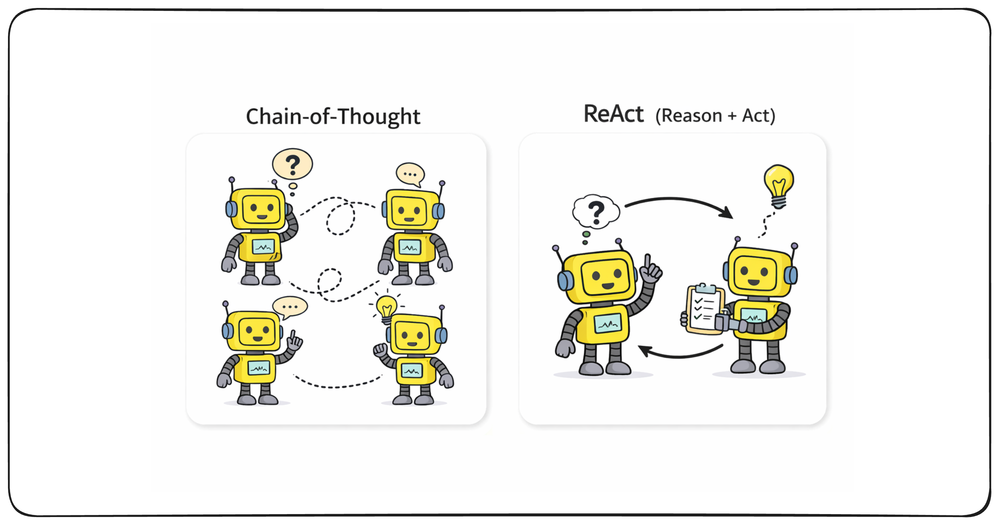


# Chain-of-Thought (CoT) Prompting

## What is Chain-of-Thought Prompting?

**Chain-of-Thought (CoT)** is a prompting technique that encourages language models to generate intermediate reasoning steps before arriving at a final answer. Instead of jumping directly to a conclusion, the model explicitly "thinks through" the problem step by step.

This approach mirrors human problem-solving: we rarely solve complex problems in one mental leap. We break them down, consider relevant information, apply logical steps, and then conclude.

## Why CoT Improves Performance

CoT prompting enhances model performance on reasoning-heavy tasks by:

1. **Decomposing Complexity**: Breaking multi-step problems into manageable sub-problems
2. **Reducing Errors**: Making the reasoning process explicit and traceable
3. **Improving Accuracy**: Allowing the model to catch and correct logical mistakes mid-stream
4. **Enhancing Interpretability**: Providing visibility into how the model reached its conclusion

### Performance Gains

Research shows CoT can improve accuracy by 10-50% on:
- **Mathematical reasoning** (arithmetic, word problems, algebra)
- **Commonsense reasoning** (causal inference, physical reasoning)
- **Symbolic manipulation** (logic puzzles, code generation)

## When to Use CoT (and When Not To)

### ✅ CoT is Effective For:

- **Multi-step reasoning**: Problems requiring sequential logic
- **Mathematical problems**: Calculations, word problems, proofs
- **Complex analysis**: Evaluating multiple factors before concluding
- **Decision-making**: Weighing pros/cons, comparing options
- **Debugging/Diagnosis**: Systematically identifying root causes

### ❌ CoT May Degrade Performance For:

- **Simple factual recall**: "What is the capital of France?" (CoT adds unnecessary overhead)
- **Pattern matching**: Direct classification tasks where reasoning isn't needed
- **Creative generation**: Poetry, storytelling (CoT can make output mechanical)
- **Time-sensitive tasks**: When latency matters and reasoning overhead is costly

**Rule of thumb**: If a human expert would "think it through," use CoT. If it's instant recall, skip it.

---

## Types of CoT Prompting

### 1. Zero-Shot CoT
Simply add reasoning instructions like `"Let's think step by step"` or `"Think carefully and reason through this"` to your prompt.

**Pros**: No examples needed, works across domains  
**Cons**: Less control over reasoning structure

### 2. Few-Shot CoT
Provide 1-3 examples showing the problem, step-by-step reasoning, and answer.

**Pros**: More control, domain-specific reasoning patterns  
**Cons**: Requires manual example creation, uses more tokens

### 3. Structured CoT
Explicitly define reasoning stages: "First analyze X. Then consider Y. Finally conclude Z."

**Pros**: Consistent structure, easier to parse outputs  
**Cons**: May constrain creative problem-solving

---

## Comparison: Direct vs Implicit vs Explicit CoT

Let's compare three approaches for the same task.

### Task: Determine if a student's math solution is correct

**Student's Work**:
```
Problem: If 3x + 5 = 20, what is x?
Student's answer: x = 5
```

### Approach 1: Direct Answer (No CoT)

**Prompt**:
```
Is the student's answer correct? Answer Yes or No.

Problem: If 3x + 5 = 20, what is x?
Student's answer: x = 5
```

**Typical Output**:
```
Yes
```

**Analysis**: Fast but risky. The model gives a confident answer without showing work. If wrong, we can't debug.

---

### Approach 2: Implicit Reasoning (Model Decides)

**Prompt**:
```
Check if the student's answer is correct. Explain your reasoning.

Problem: If 3x + 5 = 20, what is x?
Student's answer: x = 5
```

**Typical Output**:
```
The student's answer is correct. To verify: 3(5) + 5 = 15 + 5 = 20. Since 20 = 20, the answer x = 5 is correct.
```

**Analysis**: Better! The model provided reasoning, but we didn't control the structure. Different runs might vary in quality.

---

### Approach 3: Explicit Chain-of-Thought

**Prompt**:
```
Check if the student's answer is correct. Follow these steps:

1. First, solve the problem yourself step by step
2. Then, compare your answer to the student's answer
3. Finally, state whether the student is correct

Problem: If 3x + 5 = 20, what is x?
Student's answer: x = 5
```

**Typical Output**:
```
Step 1: Solve the problem
- Start with: 3x + 5 = 20
- Subtract 5 from both sides: 3x = 15
- Divide both sides by 3: x = 5

Step 2: Compare to student's answer
- My answer: x = 5
- Student's answer: x = 5

Step 3: Conclusion
The student's answer is correct.
```

**Analysis**: Most reliable. We enforced a structured reasoning process, making it easy to verify each step and parse the final judgment.

---

## How Outputs Differ

| Approach | Speed | Accuracy | Debuggability | Consistency |
|----------|-------|----------|---------------|-------------|
| **Direct** | ⚡ Fastest | ⚠️ Risky | ❌ Opaque | ⚠️ Variable |
| **Implicit** | 🏃 Fast | ✅ Better | ⚠️ Some | ⚠️ Variable |
| **Explicit CoT** | 🐌 Slower | ✅✅ Best | ✅✅ Full | ✅ Consistent |

**Key insight**: Explicit CoT trades latency and token cost for reliability and interpretability. Choose based on your application's priorities.

---

[Chain of Thought Paper Link](https://arxiv.org/pdf/2201.11903)

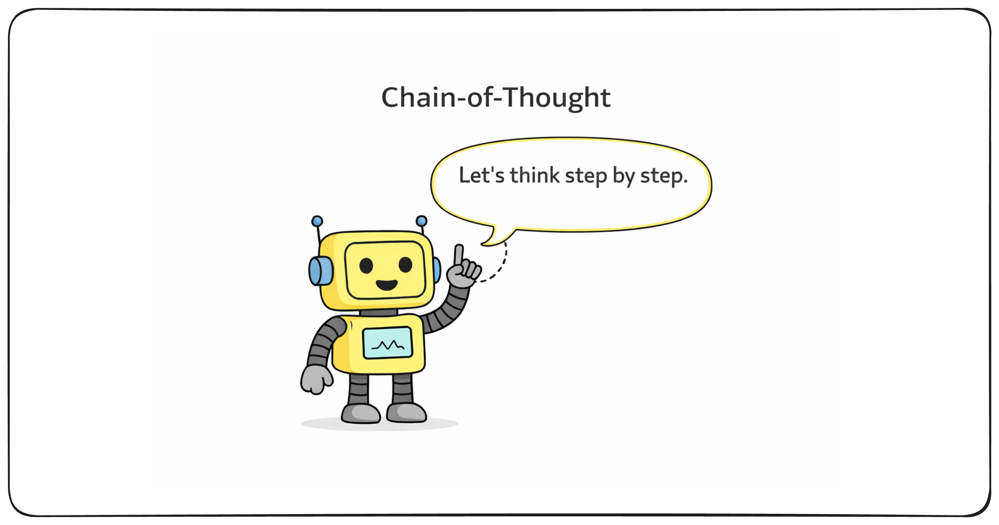

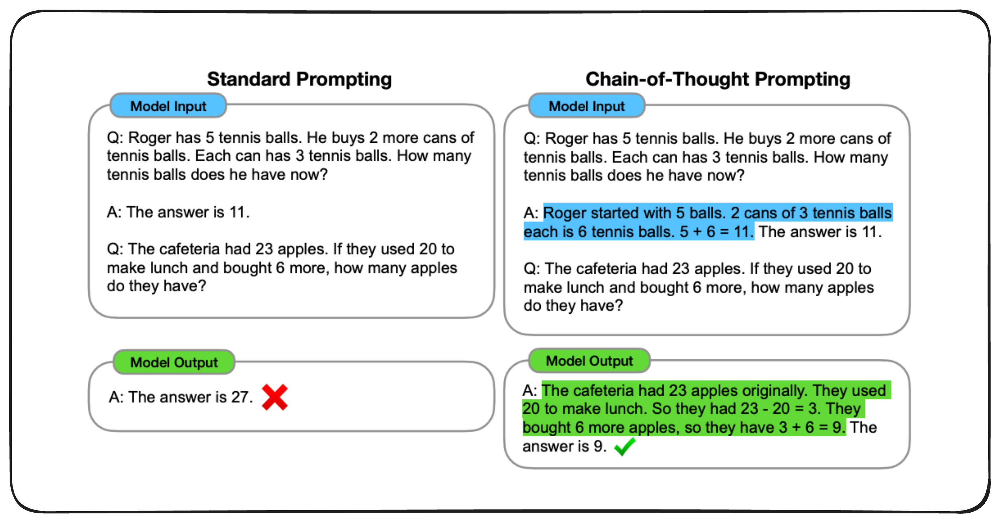

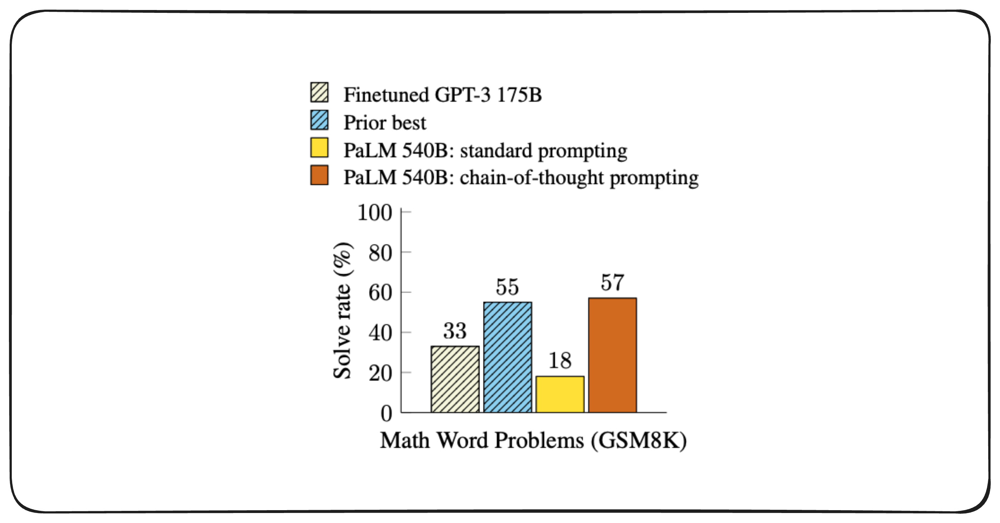

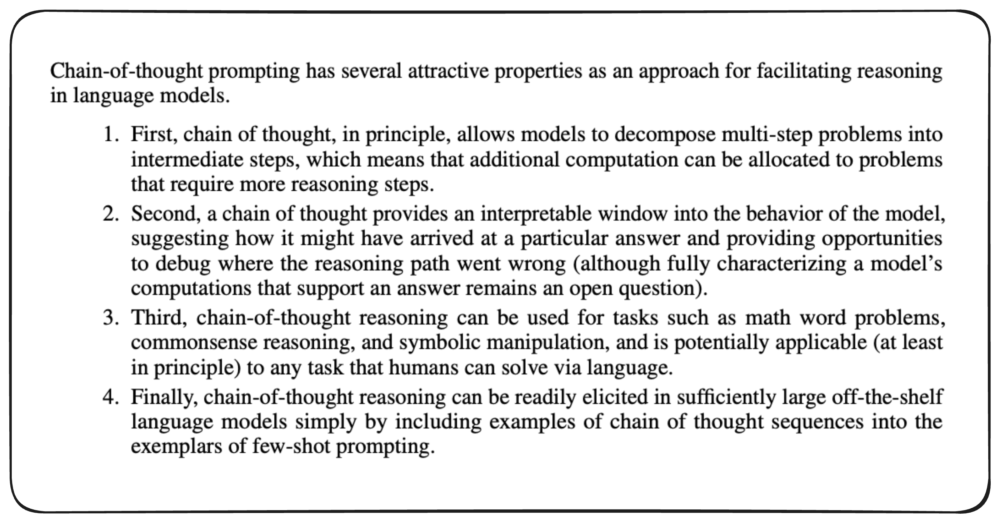

## Implementation Examples

### Example 1: Zero-Shot CoT with OpenAI

Let's solve a word problem using zero-shot CoT.

In [ ]:
# Problem setup
problem = """
A store has 45 apples. They sell 12 apples in the morning
and 18 apples in the afternoon. How many apples are left?
"""

In [ ]:
%%time
# Without CoT (direct)
direct_prompt = f"Solve this problem:\n{problem}\nAnswer:"

direct_response = generate_openai(
    prompt=direct_prompt,
    temperature=0.3,
    max_tokens=150
)

print("Direct Answer:")
print("\n" + "="*60 + "\n")

print(direct_response)
print("\n" + "="*60 + "\n")



In [ ]:
%%time
# With Zero-Shot CoT
#Solve this problem step by step: -> Proveoke the LLM for generating chain of thougths
cot_prompt = f"Let us think step by step:\n{problem}"

cot_response = generate_openai(
    prompt=cot_prompt,
    temperature=0.3,
    max_tokens=250
)

print("Chain-of-Thought Answer:")
print("\n" + "="*60 + "\n")
print(cot_response)
print("\n" + "="*60 + "\n")

In [ ]:
%%time
# With Zero-Shot CoT
#Solve this problem step by step: -> Proveoke the LLM for generating chain of thougths
cot_prompt = f"Solve this problem step by step:\n{problem}"

cot_response = generate_openai(
    prompt=cot_prompt,
    temperature=0.3,
    max_tokens=250
)

print("Chain-of-Thought Answer:")
print("\n" + "="*60 + "\n")
print(cot_response)
print("\n" + "="*60 + "\n")

### Example 2: Structured CoT with Hugging Face (Phi)

Now let's use structured CoT for a more complex analysis task.

In [ ]:
# Define a structured CoT template
cot_template = """Analyze the following data and explain the trend.

Follow these steps:
1. Identify the pattern in the data
2. Calculate the rate of change
3. Hypothesize the cause
4. Make a prediction for the next value

Data: Sales over 5 weeks
Week 1: 100 units
Week 2: 120 units
Week 3: 144 units
Week 4: 172 units
Week 5: 206 units

Begin your analysis:"""

# Generate with Phi model
response = generate_hf(
    prompt=cot_template,
    max_new_tokens=300,
    temperature=0.5,
    do_sample=True
)

print("Phi Model CoT Analysis:")
print(response)

### Example 3: Few-Shot CoT for Domain-Specific Reasoning

Few-shot CoT is powerful for teaching the model your domain's reasoning style.

In [ ]:
# Template with examples
few_shot_template = """You are a medical diagnostic assistant. For each case,
reason through symptoms systematically before diagnosing.

Example 1:
Symptoms: Fever (102°F), dry cough, fatigue
Reasoning:
- Fever + respiratory symptom suggests infection
- Dry cough indicates upper respiratory tract
- Fatigue common with viral infections
- No mention of shortness of breath (rules out severe cases)
Diagnosis: Likely viral upper respiratory infection (common cold/flu)

Example 2:
Symptoms: Severe headache, neck stiffness, photophobia, fever (103°F)
Reasoning:
- Classic triad: headache + neck stiffness + fever
- Photophobia supports meningeal irritation
- High fever suggests bacterial rather than viral
- This is a medical emergency
Diagnosis: Suspected bacterial meningitis - immediate hospitalization required

Now analyze this case:
Symptoms: {symptoms}
Reasoning:"""

# New case
new_case = "Persistent dry cough for 3 weeks, night sweats, unintended weight loss (15 lbs in 2 months)"

prompt = format_prompt(few_shot_template, symptoms=new_case)

response = generate_openai(
    prompt=prompt,
    temperature=0.4,
    max_tokens=200
)

print("Diagnostic Reasoning:")
print(response)

---

## Practical Tips

### 1. Temperature Settings
- **Lower temperature (0.2-0.4)**: Better for math/logic where deterministic reasoning is needed
- **Moderate temperature (0.5-0.7)**: Good for analysis tasks requiring some creativity
- **Higher temperature (0.8+)**: Avoid for CoT - introduces logical inconsistencies

### 2. Prompt Phrasing
Strong CoT triggers:
- "Let's think step by step"
- "Work through this methodically"
- "First... then... finally..."
- "Analyze systematically"

Weak triggers:
- "Explain" (too vague)
- "Show your work" (better but ambiguous)

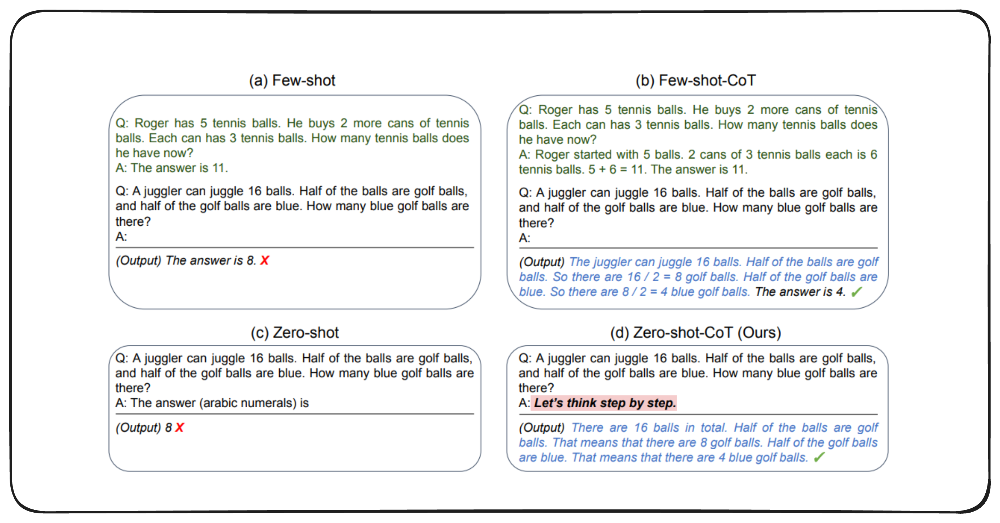

# ReAct (Reason + Act) Prompting

## What is ReAct?

**ReAct** stands for **Reason + Act**. It's a prompting technique that enables language models to solve problems by alternating between internal reasoning and external actions.

While Chain-of-Thought teaches models to "think through" problems step-by-step, ReAct goes further by allowing models to **interact with the outside world** during the reasoning process.

Think of it like this:
- **CoT**: "Think step by step, then answer"
- **ReAct**: "Think, try something, see what happens, think again, try again..."

---

## The ReAct Loop

ReAct operates in a three-step cycle:

### 1. **Thought** 🧠
The model analyzes the situation and decides what to do next.

### 2. **Action** ⚙️
The model calls a tool (search, calculator, database query, API).

### 3. **Observation** 👀
The model receives results from the tool and incorporates them into its next thought.

This cycle repeats until the model has enough information to provide a final answer.

---

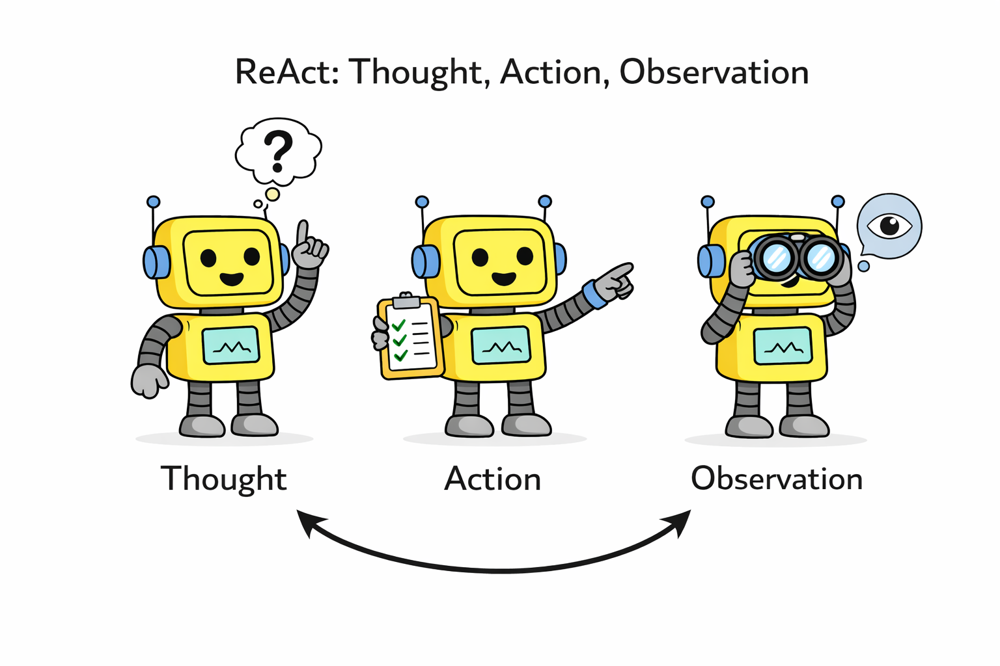

## ReAct vs Chain-of-Thought

| Aspect | Chain-of-Thought | ReAct |
|--------|------------------|-------|
| **Purpose** | Internal reasoning | Reasoning + external interaction |
| **Tools** | None needed | Requires tool access |
| **Loop** | Linear (think → answer) | Iterative (think → act → observe → repeat) |
| **Use Case** | Self-contained problems | Problems requiring external information |
| **Example** | Math word problems | "What's the weather in Tokyo?" |

**Key Insight**: CoT is like thinking to yourself. ReAct is like thinking while doing research.

---

## When to Use ReAct

### ✅ Use ReAct When:

- **External information needed**: "What's the current stock price of Apple?"
- **Multiple lookups required**: "Compare GDP growth of 5 countries"
- **Dynamic data**: Weather, news, prices, sports scores
- **Multi-step research**: "Find papers on topic X, then summarize key findings"
- **Tool interaction**: Calculator, database, API calls

### ❌ ReAct is Overkill When:

- **Problem is self-contained**: "Solve 2x + 5 = 15"
- **Factual knowledge sufficient**: "What is photosynthesis?"
- **No tools available**: Creative writing, opinion generation
- **Single-step tasks**: Simple classification, formatting
- **Speed matters more**: ReAct adds latency due to multiple LLM calls

**Rule of thumb**: If Chain-of-Thought can solve it, use CoT. If you need to look things up or take actions, use ReAct.

---

## Anatomy of a ReAct Prompt

A ReAct prompt typically includes:

1. **Role definition**: "You are a research assistant..."
2. **Process instructions**: "Think, then act, then observe..."
3. **Available tools**: Descriptions of what actions the model can take
4. **Output format**: How to structure Thought/Action/Observation
5. **Termination condition**: How to signal completion (usually a "final_answer" action)

---

#### Question:“Aside from the Apple Remote, what other device can control the program Apple Remote was originally designed to interact with?”

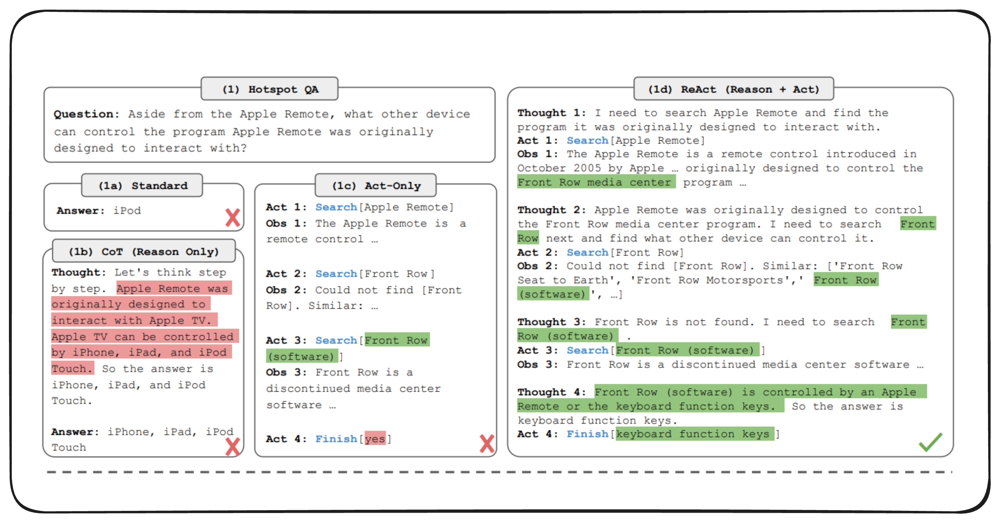

### ReAct Paper: [Paper Link](https://arxiv.org/pdf/2210.03629)

## Simulating ReAct: Basic Example

Since we can't call real tools, we'll **simulate** the ReAct loop by having the model generate thoughts and actions, then we'll manually provide observations.

### Example: Weather Query


In [7]:
# ReAct System Prompt
system_prompt = """You are a helpful assistant that can use tools.

For each step, you must respond in this format:

Thought: [Your reasoning about what to do next]
Action: [tool_name with parameters] OR FinalAnswer: [your conclusion]

Available tools:
- get_weather(city: str) - Get current weather for a city

When you have enough information, use FinalAnswer instead of Action.

Example:
Thought: I need to check the weather in Paris
Action: get_weather("Paris")
"""

# User query
user_query = "What's the weather like in Tokyo?"

# Step 1: Model's first thought and action
step1_prompt = f"User Query: {user_query}"

step1_response = generate_openai(
    system_prompt=system_prompt,
    prompt=step1_prompt,
    temperature=0.3,
    max_tokens=100
)

print_response("Step 1: Model Response", step1_response)


  Step 1: Model Response
Thought: I need to check the current weather in Tokyo.
Action: get_weather("Tokyo")



Now we simulate the tool's response:

In [8]:
simulated_observation = "Observation: Tokyo weather - Sunny, 22°C (72°F), humidity 45%"

# Step 2: Feed observation back to model
step2_prompt = f"""Previous conversation:
{step1_response}

{simulated_observation}

Now provide your final answer."""

step2_response = generate_openai(
    system_prompt=system_prompt,
    prompt=step2_prompt,
    temperature=0.3,
    max_tokens=100
)

print_response("Step 2: Final Answer", step2_response)


  Step 2: Final Answer
FinalAnswer: The current weather in Tokyo is sunny with a temperature of 22°C (72°F) and humidity at 45%.



## Complete ReAct Loop: Multi-Step Example

Let's simulate a more complex scenario requiring multiple actions.

In [9]:
# Enhanced ReAct System Prompt
system_prompt = """You are a financial research assistant with access to tools.

Respond in this format:
Thought: [reasoning]
Action: [tool_name(params)] OR FinalAnswer: [conclusion]

Available tools:
1. get_stock_price(ticker: str) - Get current stock price
2. search_news(company: str) - Search recent news about a company
3. FinalAnswer - Provide final conclusion

Continue using tools until you have enough information, then use FinalAnswer."""

user_query = "Should I invest in TechCorp? Check their stock price and recent news."

# Full conversation history
conversation = []

# Step 1: Initial thought
response_1 = generate_openai(
    system_prompt=system_prompt,
    prompt=f"User Query: {user_query}",
    temperature=0.3,
    max_tokens=150
)
print(f"Step 1:\n{response_1}\n")

# Simulated: Model says "Action: get_stock_price('TechCorp')"
# We provide observation
observation_1 = "Observation: TechCorp stock price is $150, up 5% this week"

# Step 2: Continue with observation
response_2 = generate_openai(
    system_prompt=system_prompt,
    prompt=f"{response_1}\n\n{observation_1}\n\nContinue reasoning:",
    temperature=0.3,
    max_tokens=150
)
print(f"Step 2:\n{response_2}\n")

# Simulated: Model says "Action: search_news('TechCorp')"
observation_2 = "Observation: TechCorp announced partnership with major retailer, analyst ratings upgraded"

# Step 3: Final answer
response_3 = generate_openai(
    system_prompt=system_prompt,
    prompt=f"{response_2}\n\n{observation_2}\n\nProvide your final answer:",
    temperature=0.3,
    max_tokens=150
)
print(f"Step 3:\n{response_3}\n")

Step 1:
Thought: To determine if investing in TechCorp is a good decision, I need to check their current stock price and any recent news that might affect their performance. 

Action: get_stock_price(ticker="TechCorp")

Step 2:
Thought: The stock price of TechCorp has increased by 5% this week, which is a positive indicator. However, to make a well-informed decision, I should also check for any recent news that could impact the company's performance and investor sentiment.

Action: search_news(company="TechCorp")

Step 3:
FinalAnswer: The recent partnership with a major retailer and the upgrade in analyst ratings are positive indicators for TechCorp, especially alongside the 5% increase in stock price this week. This suggests strong investor sentiment and potential for continued growth.



## Implementing a ReAct Orchestrator with Real Tools

Here's a practical orchestrator that uses **actual tools** - specifically, a real calculator.

### Step 1: Define Real Tools

In [21]:
import re
import math

# Real tool implementations
def calculator(expression: str) -> str:
    """
    Safely evaluate mathematical expressions.

    Args:
        expression: Math expression like "25 * 17" or "sqrt(144)"

    Returns:
        Result as string
    """
    print("calculator is called")
    try:
        # Sanitize input - only allow math operations
        allowed_chars = set("0123456789+-*/().% ")
        if not all(c in allowed_chars for c in expression.replace("sqrt", "").replace("pow", "")):
            return "Error: Invalid characters in expression"

        # Add math functions to namespace
        safe_dict = {
            "sqrt": math.sqrt,
            "pow": math.pow,
            "abs": abs,
            "round": round,
        }

        # Evaluate safely
        result = eval(expression, {"__builtins__": {}}, safe_dict)
        return str(result)

    except Exception as e:
        return f"Error: {str(e)}"


def search_knowledge(query: str) -> str:
    """
    Simulated knowledge base search.
    In production, this would query a real database or search engine.
    """
    # Simple knowledge base
    knowledge = {
        "prime": "A prime number is divisible only by 1 and itself. Examples: 2, 3, 5, 7, 11, 13...",
        "python": "Python is a high-level programming language known for readability and versatility.",
        "photosynthesis": "Photosynthesis is the process by which plants convert light into chemical energy.",
    }

    # Simple keyword matching
    for key, value in knowledge.items():
        if key in query.lower():
            return value

    return "No relevant information found in knowledge base."


def is_prime(n: int) -> bool:
    """Check if a number is prime."""

    print("is_prime is called")
    if n < 2:
        return False
    if n == 2:
        return True
    if n % 2 == 0:
        return False
    for i in range(3, int(math.sqrt(n)) + 1, 2):
        if n % i == 0:
            return False
    return True


def prime_checker(number: str) -> str:
    """Check if a number is prime."""
    try:
        n = int(float(number))
        result = is_prime(n)
        if result:
            return f"{n} is a prime number."
        else:
            return f"{n} is not a prime number."
    except:
        return "Error: Invalid number format"

## More Advanced: Web Search Tool

Here's how to add a real web search capability:

In [22]:
import warnings
warnings.filterwarnings("ignore")

In [23]:
!pip install ddgs -q

In [24]:
def web_search(query: str) -> str:
    """
    Real web search using a search API.
    This example uses DuckDuckGo (no API key required).

    For production, consider: Google Custom Search, Bing API, or Serper.
    """
    #try:
        # You'll need: pip install duckduckgo-search
    from ddgs import DDGS

    with DDGS() as searcher:
        results = list(searcher.text(query, max_results=1))

        #print(results)

        if not results:
            return "No search results found."

        # Format results
        #output = []
        #for i, result in enumerate(results, 1):
        #    output.append(f"{i}. {result['title']}")
        #    output.append(f"   {result['body'][:200]}...")
        #    output.append(f"   Source: {result['link']}\n")

        #print(results[0]['body'])

        return results[0]['body']

    #except ImportError:
    #    return "Error: duckduckgo-search not installed. Run: pip install duckduckgo-search"
    #except Exception as e:
    #    return f"Search error: {str(e)}"




In [25]:
web_search("current world record for marathon")

"Sabastian Sawe set the men's world record of 1:59:30 at the London Marathon on April 26, 2026, becoming the first person in history to run a sub two-hour marathon in race conditions."

### Step 2: Build the Orchestrator

In [26]:
import re

def react_agent(query: str, max_steps: int = 5, verbose: bool = True):
    """
    ReAct agent with real tool integration.

    Args:
        query: User's question
        max_steps: Maximum reasoning iterations
        verbose: Print step-by-step execution

    Returns:
        Final answer string
    """

    # Define available tools
    # Add to your tools dictionary:
    tools = {
        "calculator": calculator,
        "prime_checker": prime_checker,
        "search_knowledge": search_knowledge,
        "web_search": web_search,  # NEW
    }


    system_prompt = """You are a helpful assistant with access to tools.

For each step, respond in this exact format:

Thought: [Your reasoning about what to do next]
Action: [tool_name(parameters)]

OR when you have the final answer:

Thought: [Your final reasoning]
FinalAnswer: [Your complete answer to the user]

Available Tools:
1. calculator(expression: str) - Evaluate math expressions
   Example: calculator("25 * 17")
   Calculator tool will do multiplication addition

2. prime_checker(number: str) - Check if a number is prime
   Example: prime_checker("425")

3. search_knowledge(query: str) - Search knowledge base
   Example: search_knowledge("what is a prime number")

4. web_search(query: str) - Search the web for current information
   Example: web_search("current weather in Tokyo")

Important:
- Use ONE tool per step
- Wait for Observation before the next Thought
- Include FinalAnswer when done"""

    conversation = [f"User Query: {query}"]

    for step in range(max_steps):
        # Get model's response
        full_context = "\n\n".join(conversation)

        response = generate_openai(
            system_prompt=system_prompt,
            prompt=full_context,
            temperature=0.2,  # Low temperature for deterministic reasoning
            max_tokens=200
        )

        if verbose:
            print(f"\n{'='*60}")
            print(f"Step {step + 1}")
            print(f"{'='*60}")
            print(response)

        # Check for completion
        if "FinalAnswer:" in response:
            final_answer = response.split("FinalAnswer:")[-1].strip()
            if verbose:
                print(f"\n{'='*60}")
                print("FINAL ANSWER")
                print(f"{'='*60}")
                print(final_answer)
            return final_answer

        # Parse and execute action
        if "Action:" in response:
            action_line = response.split("Action:")[-1].strip().split("\n")[0]

            # Extract tool name and parameters
            match = re.match(r'(\w+)\((.*?)\)', action_line)

            if match:
                tool_name = match.group(1)
                params_str = match.group(2).strip().strip('"').strip("'")

                # Execute tool
                if tool_name in tools:
                    observation = tools[tool_name](params_str) #Tool call
                    observation_text = f"Observation: {observation}"

                    if verbose:
                        print(f"\n{observation_text}")

                    conversation.append(response)
                    conversation.append(observation_text)
                else:
                    error = f"Observation: Error - Tool '{tool_name}' not found"
                    conversation.append(response)
                    conversation.append(error)
                    if verbose:
                        print(f"\n{error}")
            else:
                error = "Observation: Error - Could not parse action"
                conversation.append(response)
                conversation.append(error)
                if verbose:
                    print(f"\n{error}")
        else:
            # No clear action, add response to history
            conversation.append(response)

    return "Maximum steps reached without arriving at a final answer."

In [27]:
print("\n" + "="*70)
print("TEST 1: Simple Math")
print("="*70)
result = react_agent("What is 156 multiplied by 23?")

# Test 2: Multi-step reasoning
print("\n" + "="*70)
print("TEST 2: Multi-Step Problem")
print("="*70)
result = react_agent("Calculate 17 times 29, then check if the result is prime.")

# Test 3: Knowledge + calculation
print("\n" + "="*70)
print("TEST 3: Knowledge + Math")
print("="*70)
result = react_agent("What is a prime number? Then check if 97 is prime.")


TEST 1: Simple Math

Step 1
Thought: I need to calculate the product of 156 and 23.
Action: calculator("156 * 23")
calculator is called

Observation: 3588

Step 2
Thought: I have calculated the product of 156 and 23, which is 3588.
FinalAnswer: The product of 156 and 23 is 3588.

FINAL ANSWER
The product of 156 and 23 is 3588.

TEST 2: Multi-Step Problem

Step 1
Thought: First, I need to calculate 17 times 29 to get the result. 
Action: calculator("17 * 29")
calculator is called

Observation: 493

Step 2
Thought: Now that I have the result of 17 times 29, which is 493, I need to check if this number is prime. 
Action: prime_checker("493")
is_prime is called

Observation: 493 is not a prime number.

Step 3
Thought: I have completed the calculations and checks. The result of 17 times 29 is 493, and it is not a prime number. 
FinalAnswer: The result of 17 times 29 is 493, and it is not a prime number.

FINAL ANSWER
The result of 17 times 29 is 493, and it is not a prime number.

TEST 3: 

### Complex ReAct(uses External Web Search)

In [17]:
result = react_agent("Search for the current world record for marathon, then calculate the average pace per mile.")


Step 1
Thought: I will first search for the current world record for the marathon to get the time it was completed in. 
Action: web_search("current world record marathon time")

Observation: World records in the marathon are ratified by World Athletics, the international governing body for the sport of athletics.[citation needed]. Kenyan athlete Kelvin Kiptum set a men's world record time of 2:00:35 on October 8, 2023, at the 2023 Chicago Marathon, a mixed-sex race.[1][2].

Step 2
Thought: Now that I have the marathon world record time of 2:00:35, I need to convert this time into total seconds to calculate the average pace per mile. The marathon distance is 26.2 miles. 
Action: calculator("2 * 3600 + 0 * 60 + 35")  # Convert 2 hours, 0 minutes, and 35 seconds into total seconds.

Observation: 7235

Step 3
Thought: I have the total time in seconds, which is 7235 seconds. Now, I will calculate the average pace per mile by dividing the total time in seconds by the marathon distance of 26

## Summary

**ReAct** = **Reasoning** + **Acting**

- Enables models to **interact with tools** while reasoning
- Operates in a **Thought → Action → Observation** loop
- More powerful than CoT for tasks requiring external information
- Requires orchestration logic to manage the loop
- Best for: research, data lookup, multi-step investigation
- Overkill for: self-contained reasoning, creative tasks

**Next Steps**: ReAct forms the foundation for autonomous agents. To build production systems, you'd add:
- Real tool integration (APIs, databases, calculators)
- Robust parsing of model outputs
- Error handling and retries
- Multi-agent coordination (covered later)

ReAct unlocks a new paradigm: LLMs that don't just think, but **act** based on their thoughts.


# Prompting for RAG (Retrieval-Augmented Generation)

## What is RAG?

**RAG (Retrieval-Augmented Generation)** is a technique that enhances LLM responses by providing relevant context retrieved from external knowledge sources.

Instead of relying solely on the model's training data, RAG:
1. **Retrieves** relevant documents from a knowledge base
2. **Augments** the prompt with this retrieved context
3. **Generates** a response grounded in the provided information

**Simple analogy**: It's like an open-book exam. Instead of memorizing everything, the model can reference specific documents to answer questions accurately.

---

## Why RAG?

### ✅ Benefits

- **Reduces hallucinations**: Model has factual context to reference
- **Up-to-date information**: Knowledge base can be updated without retraining
- **Domain-specific knowledge**: Add company docs, research papers, policies
- **Verifiable answers**: Responses can cite sources
- **Cost-effective**: Cheaper than fine-tuning for specific domains

### ❌ Without RAG

```
User: "What is our company's remote work policy?"
LLM: "Most companies allow 2-3 days remote..." [HALLUCINATED - generic answer]
```

### ✅ With RAG

```
Retrieved Context: "Employees may work remotely up to 4 days per week..."
LLM: "According to company policy, employees may work remotely up to 4 days per week."
```

---

## RAG Prompt Template

A good RAG prompt has three components:

### 1. **Instructions** (How to use the context)
```
You are a helpful assistant. Answer questions using ONLY the provided context.
If the context doesn't contain enough information, say "I don't know based on the provided context."
```

### 2. **Retrieved Context** (The knowledge)
```
Context:
---
[Document 1 text here]
---
[Document 2 text here]
---
```

### 3. **User Question** (The query)
```
Question: [User's actual question]

Answer:
```

---

## RAG Prompting Best Practices

### 1. **Enforce Grounding**
- Explicitly instruct: "Answer ONLY using the provided context"
- Prevent the model from using external knowledge

### 2. **Require Citations**
- Ask for source references: "Cite the document ID or section"
- Makes responses verifiable and trustworthy

### 3. **Handle Insufficient Context**
- Instruct what to say when context is incomplete
- E.g., "I don't know based on the provided context"
- Prevents hallucinations when information is missing

### 4. **Respect Context Limits**
- Models have token limits (4K-128K depending on model)
- Retrieve only top-k most relevant documents (typically 3-5)
- Don't overload the prompt

### 5. **Structure Context Clearly**
- Use delimiters (---, ===, or <doc></doc> tags)
- Include document IDs for citation
- Make it easy for the model to reference specific parts

---

## Bad vs Good RAG Prompts

### ❌ Bad RAG Prompt

```python
prompt = f"""
Answer this question: {question}

Here's some context: {context}
"""
```

**Problems:**
- No grounding instructions (model might hallucinate)
- No guidance on what to do if context is insufficient
- No structure for citations
- Vague, informal

---


### ✅ Good RAG Prompt

```python
prompt = f"""
You are a helpful assistant. Answer the question using ONLY the information
provided in the context below.

If the context does not contain enough information to answer the question,
respond with: "I don't know based on the provided context."

When possible, cite the document ID (e.g., [Doc 1]) where you found the information.

Context:
---
{context}
---

Question: {question}

Answer:
"""
```

**Why it works:**
- Clear grounding rule ("ONLY the information provided")
- Explicit fallback behavior ("I don't know based on...")
- Citation instructions
- Professional structure

---

In [ ]:
print()

# Prompt Templating

## Why Templates?

As prompts become complex (especially for RAG), hardcoding them becomes messy. **Prompt templating** solves this by separating structure from content.

### Without Templates (Messy)
```python
prompt = f"""You are a helpful assistant.
Answer using only the context below.

Context:
{context}

Question: {question}

Answer:"""
```

### With Templates (Clean)
```python
prompt = template.render(context=context, question=question)
```

---

## Jinja2 for Prompt Templating

**Jinja2** is a powerful templating engine that makes prompts maintainable and reusable.

### Installation

In [ ]:
!pip install jinja2 -q

## Simple RAG Template with Jinja2

### Step 1: Define the Template

In [ ]:
from jinja2 import Template

# RAG prompt template
rag_template_str = """You are a helpful assistant. Answer questions using ONLY the provided context.

If the context doesn't contain enough information, respond: "I don't know based on the provided context."

Context:
{% for doc in documents %}
---
[{{ doc.id }}] {{ doc.text }}
{% endfor %}
---

Question: {{ question }}

Answer:"""

# Create Jinja2 template object
rag_template = Template(rag_template_str)

In [ ]:
rag_template

### Step 2: Use the Template


In [ ]:
# Sample documents retreived from vector db
documents = [
    {"id": "doc_1", "text": "Our return policy allows returns within 30 days of purchase."},
    {"id": "doc_2", "text": "Shipping is free for orders over $50."},
    {"id": "doc_3", "text": "We accept Visa, Mastercard, and PayPal."}
]

# User question
question = "What is your return policy?"

# Render the template
prompt = rag_template.render(
    documents=documents,
    question=question
)

print("Generated Prompt:")
print("=" * 60)
print(prompt)
print("=" * 60)



### Step 2: Generate


In [ ]:
# Generate response
response = generate_openai(
    prompt=prompt,
    temperature=0.2,
    max_tokens=200
)

print_response("RAG Response", response)